In [1]:
from google.colab import drive
import gdown

# Download using gdown
url = 'https://drive.google.com/uc?id=1VNpyNkGxHdskfdTNRSjjyNa5qC9u0JyV'
!gdown $url

Downloading...
From (original): https://drive.google.com/uc?id=1VNpyNkGxHdskfdTNRSjjyNa5qC9u0JyV
From (redirected): https://drive.google.com/uc?id=1VNpyNkGxHdskfdTNRSjjyNa5qC9u0JyV&confirm=t&uuid=e347a454-c968-4798-8007-3413fe882c90
To: /content/Fraud.csv
100% 494M/494M [00:20<00:00, 24.6MB/s]


In [2]:
# Libraries for data Manipulation
import pandas as pd
import numpy as np
from IPython.display import display

In [3]:
%unload_ext google.colab.data_table

The google.colab.data_table extension is not loaded.


In [4]:
# Libraries for PLots
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
sns.set(style = "whitegrid")

In [5]:
from google.colab import data_table
data_table.enable_dataframe_formatter()

**EDA of Fraud dataset**

In [6]:
# Load the dataset
print("Loading the dataset...")
df = pd.read_csv('Fraud.csv')


# Display the DataFrame using data_table.DataTable
data_table.DataTable(
    df, include_index=False, num_rows_per_page=10
)

Loading the dataset...


,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
0,1,PAYMENT,9839.64,C1231006815,170136.00,160296.36,M1979787155,0.00,0.00,0,0
1,1,PAYMENT,1864.28,C1666544295,21249.00,19384.72,M2044282225,0.00,0.00,0,0
2,1,TRANSFER,181.00,C1305486145,181.00,0.00,C553264065,0.00,0.00,1,0
3,1,CASH_OUT,181.00,C840083671,181.00,0.00,C38997010,21182.00,0.00,1,0
4,1,PAYMENT,11668.14,C2048537720,41554.00,29885.86,M1230701703,0.00,0.00,0,0
...,...,...,...,...,...,...,...,...,...,...,...
6362615,743,CASH_OUT,339682.13,C786484425,339682.13,0.00,C776919290,0.00,339682.13,1,0
6362616,743,TRANSFER,6311409.28,C1529008245,6311409.28,0.00,C1881841831,0.00,0.00,1,0
6362617,743,CASH_OUT,6311409.28,C1162922333,6311409.28,0.00,C1365125890,68488.84,6379898.11,1,0
6362618,743,TRANSFER,850002.52,C1685995037,850002.52,0.00,C2080388513,0.00,0.00,1,0


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6362620 entries, 0 to 6362619
Data columns (total 11 columns):
 #   Column          Dtype  
---  ------          -----  
 0   step            int64  
 1   type            object 
 2   amount          float64
 3   nameOrig        object 
 4   oldbalanceOrg   float64
 5   newbalanceOrig  float64
 6   nameDest        object 
 7   oldbalanceDest  float64
 8   newbalanceDest  float64
 9   isFraud         int64  
 10  isFlaggedFraud  int64  
dtypes: float64(5), int64(3), object(3)
memory usage: 534.0+ MB


In [8]:
df.columns

Index(['step', 'type', 'amount', 'nameOrig', 'oldbalanceOrg', 'newbalanceOrig',
       'nameDest', 'oldbalanceDest', 'newbalanceDest', 'isFraud',
       'isFlaggedFraud'],
      dtype='object')

In [9]:
df["isFraud"].value_counts()

,count
isFraud,
0,6354407
1,8213


We have 8213 fraud cases.

In [10]:
df["isFlaggedFraud"].value_counts()

,count
isFlaggedFraud,
0,6362604
1,16


We can see flagged fraud cases are very less (16).

In [11]:
df.isnull().sum().sum()

np.int64(0)

We have 0 null cases in all of the columns combined.

In [12]:
df.shape

(6362620, 11)

We have 6362620 rows and 11 columns.

In [13]:
# Percentage of fraud cases

perc = df["isFraud"].value_counts()[1] / df.shape[0]
perc = perc * 100
perc

np.float64(0.12908204481801522)

Fraud Percentage we get as 0.13% .

**Visualization for fraud dataset**

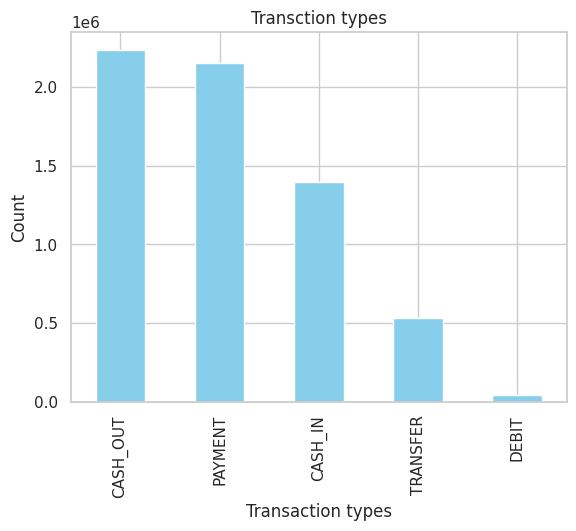

In [14]:
df['type'].value_counts().plot(kind = "bar" ,title= "Transction types" , color = "skyblue")
plt.xlabel("Transaction types")
plt.ylabel("Count")
plt.show()


We can see that the no. of Transcation are in following order:

    CASH_OUT > PAYMENT > CASH_IN > TRANSFER > DEBIT

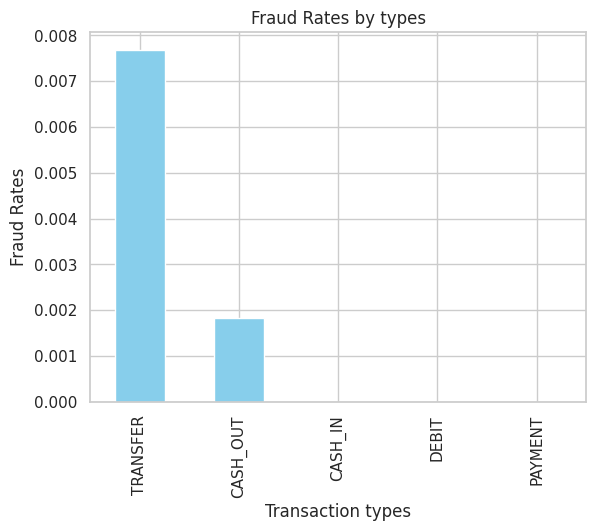

,isFraud
type,
TRANSFER,0.007688
CASH_OUT,0.001840
CASH_IN,0.000000
DEBIT,0.000000
PAYMENT,0.000000


In [15]:
# Fraud Rates by types
fraud = df.groupby("type")["isFraud"].mean().sort_values(ascending = False)
fraud.plot(kind = 'bar' , title = "Fraud Rates by types" , color = "skyblue")
plt.xlabel("Transaction types")
plt.ylabel("Fraud Rates")
plt.show()
fraud

  TRANSFER transactions have the highest fraud rate , significantly more than any other type.



  CASH_OUT transactions also have some fraud risk , but far lower than TRANSFER.



  CASH_IN, DEBIT, and PAYMENT transactions show negligible fraud rates in the dataset.



In [16]:
# Lets check out the amount column
df["amount"].describe()

,amount
count,6.362620e+06
mean,1.798619e+05
std,6.038582e+05
min,0.000000e+00
25%,1.338957e+04
50%,7.487194e+04
75%,2.087215e+05
max,9.244552e+07


In [17]:
df["amount"].describe().astype(int)

,amount
count,6362620
mean,179861
std,603858
min,0
25%,13389
50%,74871
75%,208721
max,92445516


We can determine that this can be right-skewed.

Also standard deviation is very big.

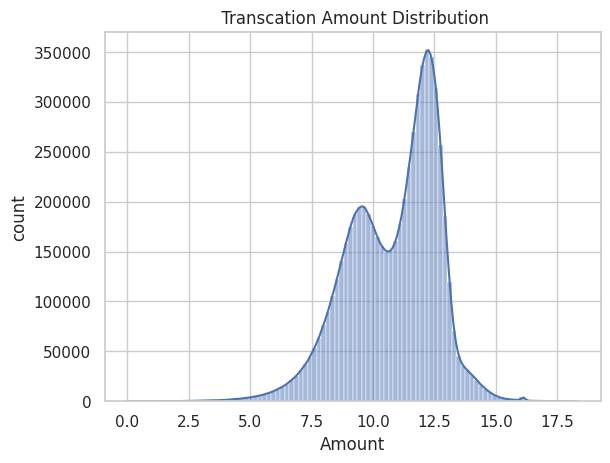

In [18]:
# Histogram for thhis

sns.histplot(np.log1p(df['amount']) , bins = 100 , kde = True)
plt.xlabel("Amount")
plt.ylabel("count")
plt.title(" Transcation Amount Distribution")
plt.show()

We can see that we might have  cases in the right end of the plots which are fraudulent cases.

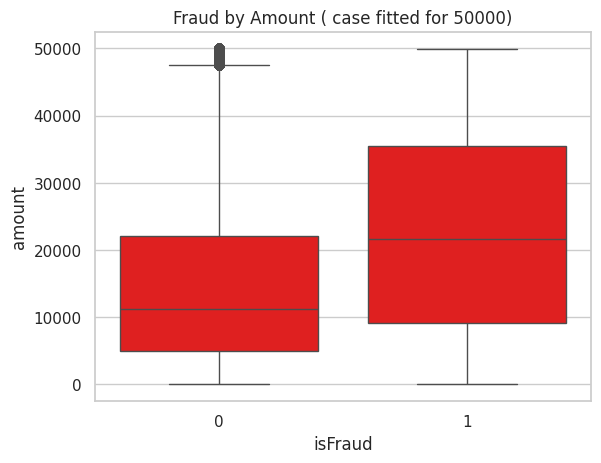

In [19]:
# Let see the relationship of fraud and amount
sns.boxplot(data=df[df["amount"] < 50000] , x = "isFraud", y = "amount", color= "red")
plt.title("Fraud by Amount ( case fitted for 50000)")
plt.show()

Here we can see that the Median amount in fraud cases (isFraud = 1) is noticeably higher than in non-fraud cases (isFraud = 0).

For fraud cases the IQR is wider that means the fraudulent amounts vary more significantly.

In [20]:
# Outlier detection using IQR on 'amount'

amount = df["amount"]
Q1 = amount.quantile(0.25)
Q3 = amount.quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5 * IQR
upper = Q3 + 1.5 * IQR
outlier_count = ((amount < lower) | (amount > upper)).sum()
print("Amount outliers (IQR rule):", int(outlier_count), "out of", len(df))

Amount outliers (IQR rule): 338078 out of 6362620


Outlier treatment

We detected X outliers in `amount (IQR rule). Rather than dropping all, we:
- log-transformed amount for modeling to reduce skew, and
- flagged extreme transactions with amount_outlier_iqr to use as a feature.
This preserves potentially fraudulent high-value transactions.


In [21]:
df.columns

Index(['step', 'type', 'amount', 'nameOrig', 'oldbalanceOrg', 'newbalanceOrig',
       'nameDest', 'oldbalanceDest', 'newbalanceDest', 'isFraud',
       'isFlaggedFraud'],
      dtype='object')

In [22]:
# Check anamolies in Balance
# Lets check if we have negative balance

df["balancediffOrigin"] = df["oldbalanceOrg"] - df["newbalanceOrig"]
df["balancediffDestination"] = df["oldbalanceDest"] - df["newbalanceDest"]

In [23]:
(df["balancediffOrigin"] < 0).sum()

np.int64(1399253)

This indicate we have large number of negative balances.

In [24]:
(df["balancediffDestination"] < 0).sum()

np.int64(2806464)

we can see here that the no of anomalies where the destination account’s new balance is lower than its old balance.

In [25]:
df["balancediffOrigin"].describe().astype(int)

,balancediffOrigin
count,6362620
mean,-21230
std,146643
min,-1915267
25%,0
50%,0
75%,10150
max,10000000


In [26]:
df["balancediffDestination"].describe().astype(int)

,balancediffDestination
count,6362620
mean,-124294
std,812939
min,-105687838
25%,-149105
50%,0
75%,0
max,13060826


In [27]:
df.head(3)

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,balancediffOrigin,balancediffDestination
0,1,PAYMENT,9839.64,C1231006815,170136.0,160296.36,M1979787155,0.0,0.0,0,0,9839.64,0.0
1,1,PAYMENT,1864.28,C1666544295,21249.0,19384.72,M2044282225,0.0,0.0,0,0,1864.28,0.0
2,1,TRANSFER,181.00,C1305486145,181.0,0.00,C553264065,0.0,0.0,1,0,181.00,0.0


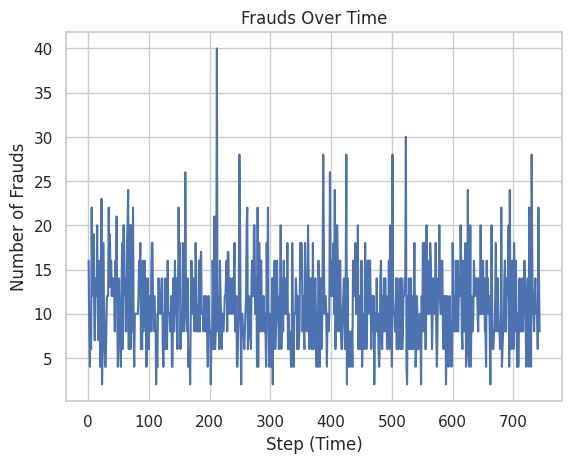

In [28]:
frauds_per_step = df [df ["isFraud"] == 1] ["step"].value_counts().sort_index()
plt.plot(frauds_per_step.index , frauds_per_step.values, label="Frauds per Step")
plt.xlabel("Step (Time)")
plt.ylabel("Number of Frauds")
plt.title("Frauds Over Time")
plt.grid(True)
plt.show()


we can see that step doesnt make any sense here so lets drop it.

In [29]:
df.drop(columns="step" , inplace=True)

In [30]:
df.head()

,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,balancediffOrigin,balancediffDestination
0,PAYMENT,9839.64,C1231006815,170136.0,160296.36,M1979787155,0.0,0.0,0,0,9839.64,0.0
1,PAYMENT,1864.28,C1666544295,21249.0,19384.72,M2044282225,0.0,0.0,0,0,1864.28,0.0
2,TRANSFER,181.00,C1305486145,181.0,0.00,C553264065,0.0,0.0,1,0,181.00,0.0
3,CASH_OUT,181.00,C840083671,181.0,0.00,C38997010,21182.0,0.0,1,0,181.00,21182.0
4,PAYMENT,11668.14,C2048537720,41554.0,29885.86,M1230701703,0.0,0.0,0,0,11668.14,0.0


In [31]:
#Lets seee top sender and top recievers

top_senders = df["nameOrig"].value_counts().head(10)
top_senders

,count
nameOrig,
C1530544995,3
C545315117,3
C724452879,3
C1784010646,3
C1677795071,3
C1462946854,3
C1065307291,3
C1999539787,3
C2098525306,3


In [32]:
top_receivers = df["nameDest"].value_counts().head(10)
top_receivers

,count
nameDest,
C1286084959,113
C985934102,109
C665576141,105
C2083562754,102
C248609774,101
C1590550415,101
C1789550256,99
C451111351,99
C1360767589,98


In [33]:
# Checking for fraud users using nameOrig
fraud_users = df [df ["isFraud"] == 1] ["nameOrig"]. value_counts () .head(10)

In [34]:
fraud_users

,count
nameOrig,
C1280323807,1
C1305486145,1
C840083671,1
C1420196421,1
C2101527076,1
C1039979813,1
C2089752665,1
C1614818636,1
C40604503,1


In [35]:
# Let see fraud tyypes by type
fraud_types = df [df ["type"].isin(["CASH_OUT" , "TRANSFER"])]
fraud_types["type"]. value_counts ()

,count
type,
CASH_OUT,2237500
TRANSFER,532909


<Axes: xlabel='type', ylabel='count'>

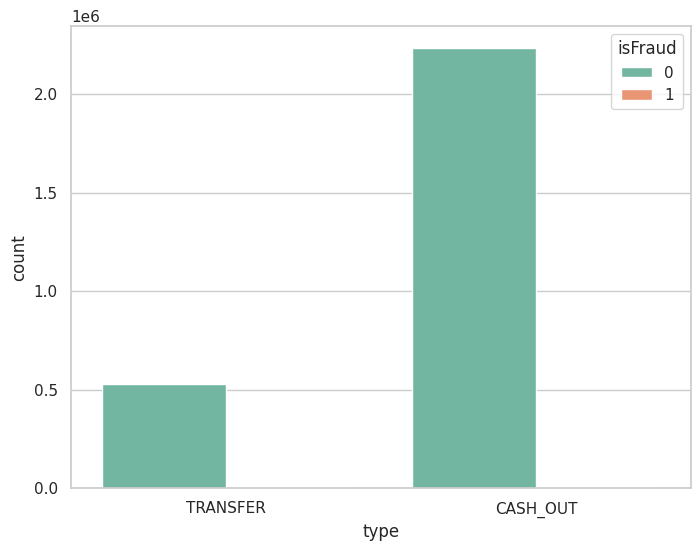

In [36]:
#Count plot for if fraud or not by fraud_types
plt.figure(figsize=(8, 6))
sns.countplot(data=fraud_types, x="type", hue="isFraud", palette="Set2")

In [37]:
# Lets create correaltion matrix

corr = df[["amount","oldbalanceOrg"	,"newbalanceOrig",	"oldbalanceDest",	"newbalanceDest",	"isFraud"]].corr()
corr

,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud
amount,1.000000,-0.002762,-0.007861,0.294137,0.459304,0.076688
oldbalanceOrg,-0.002762,1.000000,0.998803,0.066243,0.042029,0.010154
newbalanceOrig,-0.007861,0.998803,1.000000,0.067812,0.041837,-0.008148
oldbalanceDest,0.294137,0.066243,0.067812,1.000000,0.976569,-0.005885
newbalanceDest,0.459304,0.042029,0.041837,0.976569,1.000000,0.000535
isFraud,0.076688,0.010154,-0.008148,-0.005885,0.000535,1.000000


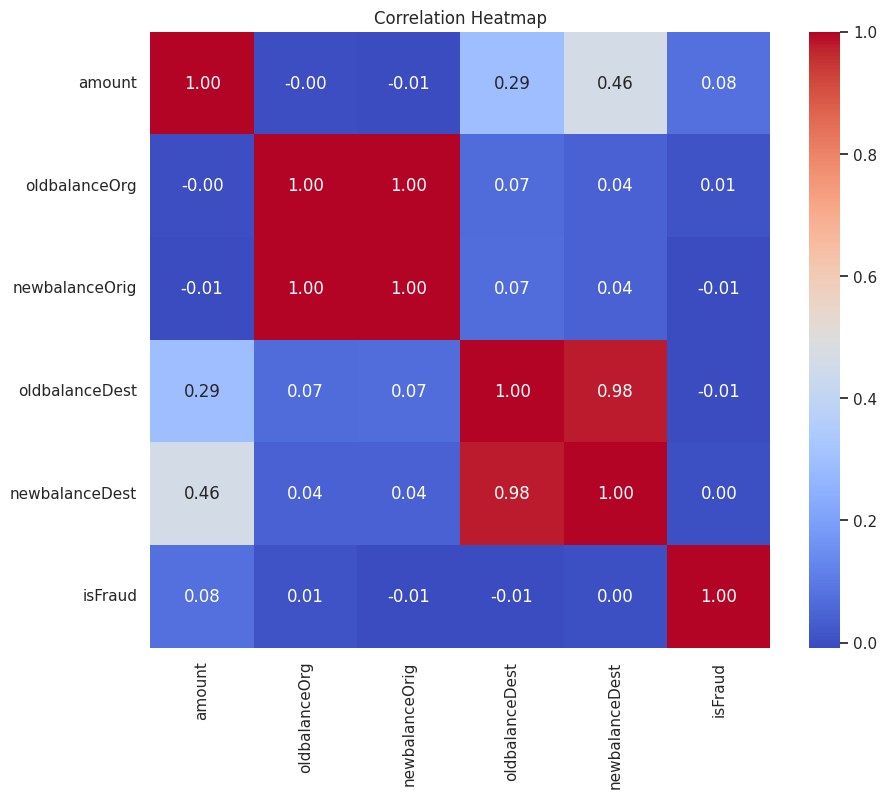

In [38]:
#lets create heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

In [56]:
# VIF calculation for numeric features
from statsmodels.stats.outliers_influence import variance_inflation_factor
numeric_cols = ['amount','oldbalanceOrg','newbalanceOrig','oldbalanceDest','newbalanceDest']
X_num = df[numeric_cols].fillna(0)
vif_data = pd.DataFrame({
    "feature": numeric_cols,
    "VIF": [variance_inflation_factor(X_num.values, i) for i in range(X_num.shape[1])]
})
vif_data


,feature,VIF
0,amount,3.861988
1,oldbalanceOrg,464.011728
2,newbalanceOrig,465.356124
3,oldbalanceDest,70.452251
4,newbalanceDest,82.167173


 Multicollinearity check:

- VIF > 5 (or 10) indicates strong multicollinearity.
- If any numeric features show high VIF (e.g., old/new balances), we either:
  - drop one of the correlated columns, or
  - use dimensionality reduction (PCA) or engineered features (balance difference) to remove redundancy.


In [39]:
#filter the customer whose balacne gets set at zero
zero_after_transfer = df [
(df ["oldbalanceOrg"] > 0) &
(df ["newbalanceOrig"] == 0 ) &
(df["type"].isin( ["TRANSFER","CASH_OUT"]))
]
zero_after_transfer.head()

,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,balancediffOrigin,balancediffDestination
2,TRANSFER,181.00,C1305486145,181.0,0.0,C553264065,0.0,0.00,1,0,181.0,0.00
3,CASH_OUT,181.00,C840083671,181.0,0.0,C38997010,21182.0,0.00,1,0,181.0,21182.00
15,CASH_OUT,229133.94,C905080434,15325.0,0.0,C476402209,5083.0,51513.44,0,0,15325.0,-46430.44
19,TRANSFER,215310.30,C1670993182,705.0,0.0,C1100439041,22425.0,0.00,0,0,705.0,22425.00
24,TRANSFER,311685.89,C1984094095,10835.0,0.0,C932583850,6267.0,2719172.89,0,0,10835.0,-2712905.89


In [40]:
len(zero_after_transfer)

1188074

**Feature Engineering**

In [41]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

In [42]:
df.columns

Index(['type', 'amount', 'nameOrig', 'oldbalanceOrg', 'newbalanceOrig',
       'nameDest', 'oldbalanceDest', 'newbalanceDest', 'isFraud',
       'isFlaggedFraud', 'balancediffOrigin', 'balancediffDestination'],
      dtype='object')

In [43]:
#droping columns that ot gonna use
df_model = df.drop(["nameOrig" , "nameDest" , "isFlaggedFraud"], axis=1)

### Variable selection approach
We selected features using a combination of:
1. Domain rules: dropped identifiers (`nameOrig`,`nameDest`) and `isFlaggedFraud` (leak).
2. Derived features: `balancediffOrigin`, `balancediffDestination`, `amount_outlier_iqr`, `log_amount`.
3. Statistical checks: correlation matrix + VIF to avoid multicollinearity.


In [44]:
df_model.head()

,type,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud,balancediffOrigin,balancediffDestination
0,PAYMENT,9839.64,170136.0,160296.36,0.0,0.0,0,9839.64,0.0
1,PAYMENT,1864.28,21249.0,19384.72,0.0,0.0,0,1864.28,0.0
2,TRANSFER,181.00,181.0,0.00,0.0,0.0,1,181.00,0.0
3,CASH_OUT,181.00,181.0,0.00,21182.0,0.0,1,181.00,21182.0
4,PAYMENT,11668.14,41554.0,29885.86,0.0,0.0,0,11668.14,0.0


In [45]:
# set categorical and numericalt type
categorical_cols = ["type"]
numerical_cols = ["amount",	"oldbalanceOrg"	,"newbalanceOrig",	"oldbalanceDest",	"newbalanceDest"]

In [46]:
# Seeting the target
y = df_model["isFraud"]

X = df_model.drop("isFraud", axis=1)


In [47]:
# Train, test splti

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y)

In [48]:
# preprocessing

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),
        ('cat', OneHotEncoder(drop = "first"), categorical_cols)
    ],
    remainder = "drop")

In [49]:
#create model pipeline

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(class_weight="balanced", max_iter=1000)) # handine class imbalance situtaution
])

In [50]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['amount', 'oldbalanceOrg',
                                                   'newbalanceOrig',
                                                   'oldbalanceDest',
                                                   'newbalanceDest']),
                                                 ('cat',
                                                  OneHotEncoder(drop='first'),
                                                  ['type'])])),
                ('classifier',
                 LogisticRegression(class_weight='balanced', max_iter=1000))])

In [51]:
y_pred =pipeline.predict(X_test)

In [52]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.94      0.97   1906322
           1       0.02      0.95      0.04      2464

    accuracy                           0.94   1908786
   macro avg       0.51      0.94      0.51   1908786
weighted avg       1.00      0.94      0.97   1908786



In [53]:
confusion_matrix(y_test, y_pred)

array([[1799862,  106460],
       [    135,    2329]])

We can say that model is good in catching the fraud but precision is not that good.

In [54]:
pipeline.score(X_train, y_train)

0.9442826113411501

ROC AUC: 0.9893385104180421
Average Precision (AUPRC): 0.5509376617873933


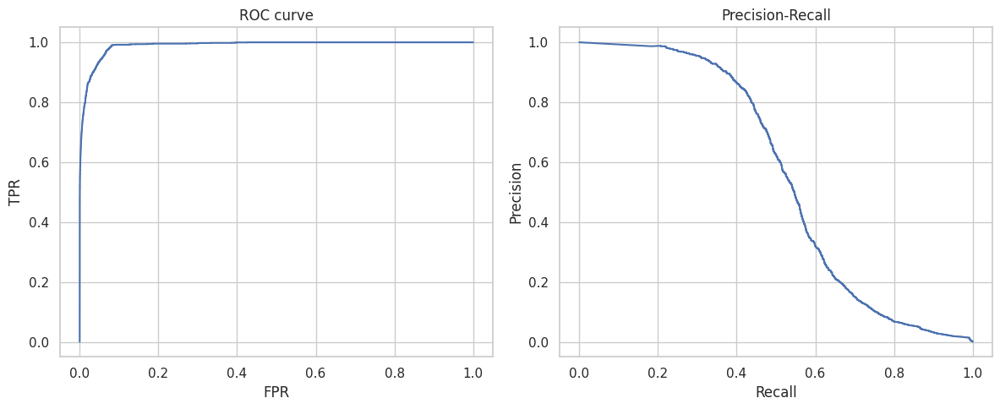

In [57]:
# ROC AUC and Precision-Recall curve
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_curve, average_precision_score

y_prob = pipeline.predict_proba(X_test)[:,1]
print("ROC AUC:", roc_auc_score(y_test, y_prob))
print("Average Precision (AUPRC):", average_precision_score(y_test, y_prob))

# Plot ROC and PR curves
import matplotlib.pyplot as plt
fpr, tpr, _ = roc_curve(y_test, y_prob)
precision, recall, _ = precision_recall_curve(y_test, y_prob)

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(fpr, tpr); plt.title("ROC curve"); plt.xlabel("FPR"); plt.ylabel("TPR")
plt.subplot(1,2,2)
plt.plot(recall, precision); plt.title("Precision-Recall"); plt.xlabel("Recall"); plt.ylabel("Precision")
plt.tight_layout()


Accuracy is 94%

In [55]:
#Saving the pipeline
import joblib
joblib.dump(pipeline, 'pipeline.pkl')

['pipeline.pkl']

## Actionable recommendations for prevention & infrastructure

1. **Real-time transaction scoring**: Deploy model to score each transaction in real time, flagging high-risk for manual review.
2. **Rules + ML hybrid**: Combine ML score with business rules (e.g., transfers to new external accounts, rapid multiple cash-outs).
3. **Balance anomaly monitor**: Add alerts for negative balance diffs (`balancediffOrigin` < 0 or `balancediffDestination` < 0).
4. **Adaptive rules for high-risk types**: For `TRANSFER` and `CASH_OUT` apply stricter limits and two-factor verification.
5. **Logging & audit trails**: Store features and model scores for each flagged transaction for audit and model retraining.
6. **Rate-limiting & challenge flows**: Rate-limit high-frequency sender accounts and challenge suspicious transactions (OTP, KYC check).

These measures allow quick blocking and give signals for continued model improvement.


## How to determine if prevention measures work

Key metrics to monitor (before vs after):
- Fraud rate (frauds / transactions) and $loss$ prevented.
- False positive rate (legitimate transactions blocked).
- Precision@k and recall@k for top-k flagged transactions.
- Time-to-detection and manual review workload.
- A/B test: route X% of traffic through new system and compare above metrics vs control.

Operationalize:
- Define KPIs and alert thresholds (e.g., precision >= X, FP rate <= Y).
- Monitor model drift and retrain monthly or when metrics degrade.
